### Threads:

1. Active entity: executing unit of a process
1. Works simutaniously with others: many threads executing
1. Require coordination: sharing of I/O devices, CPU, memory, etc.




### process ve thread

 A process is represented by its address space (PCB) which contains all the virtial to physical address mapping, for data/file and executation context.
 
Thread: 
1. represent multiple independent executation contexts. 
1. From the same virtual address space
1. With different program counters, stack pointers, stack, thread specific registers.
1. For each thread we need a data structure to represent the per thread information.

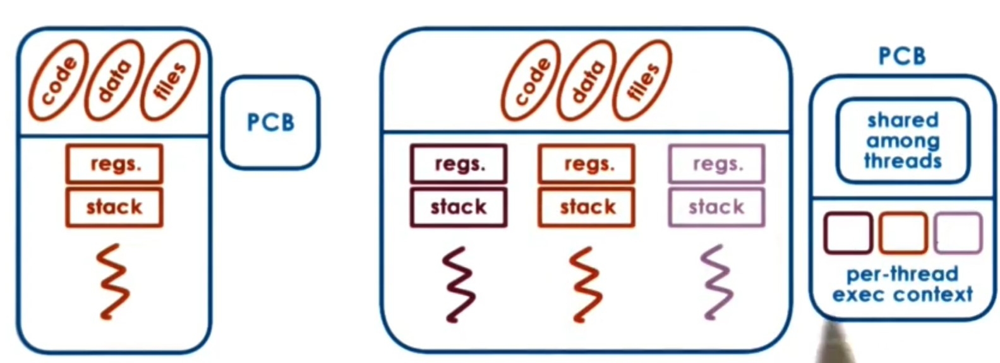

#### Benefits of Threads:
1. Parallelization: speed up
1. Speicalization: hot cache
1. Lower memory requirement: If process, then they don't share address space, we have to allocate for every single context, address space and execution context. Therefore multi threads is more meoery efficient and require fewer swap from disk.
1. Cheaper IPC: More efficent communication between threads



If t_idle > 2*t_ctx_switch then it is worth to context switch 
t_ctx_swtich thread < process because thread swtich doesn't need to map virtal to physical address. Hide more latency.

Multithread OS kernel
1. threads work on behalf of apps
1. OS-level services like daemons or drivers

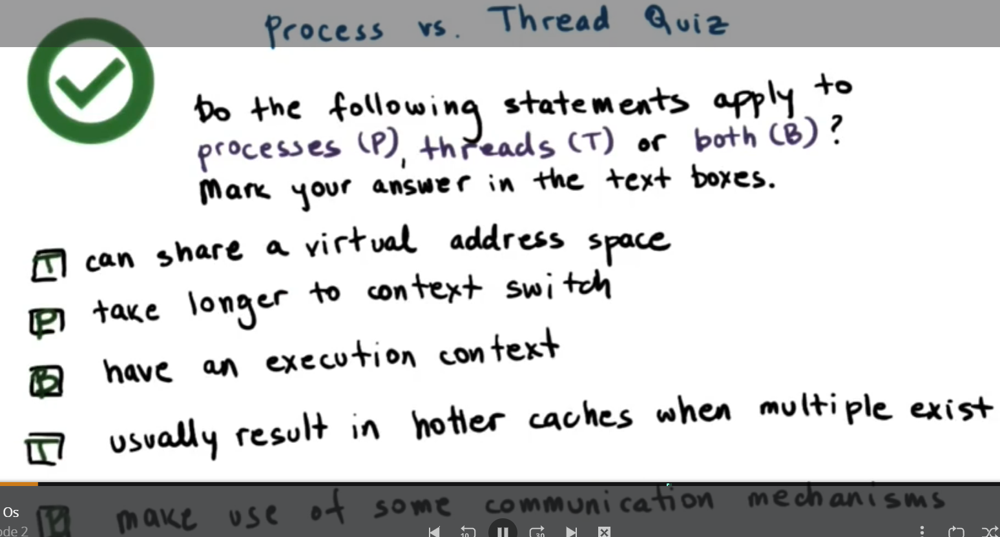

Thread data structure: identify threads, keep track of resource usage
1. Mechanism to create and manage threads
1. Mechanism to safely coordinate among threads running concurrently in the same address space


#### Concurrency Control & Coordination

Synchronization Mechanism:

Multual Exclusion
1. Exclusive access to only one thread at a time
1. mutex

Waiting on other thread
1. Specific conditions before proceeding
1. Condition variable

Waking up other threads from wait state




#### Thread and Thread Creation

Thread type: thread data structure: including thread ID, PC, SP, registers, stack, attributes

Fork (proc, args): create a new thread (not unix fork which create a new process exactly same as the calling process )

T0 calls T1 = fork(proc, args) T1 data structure: PC = proc, stack  = args
After the fork operation completes the process has two threads. T0 executes the instruction after fork.
When T1 finishes

Join (thread): terminate a thread

A parent thread call join, child_result =join(t1), it will be blocked until the child is complete. Join will return the result of the child's computation to the parent. Any allocated data structure and resourses to child will be freed.

### Thread creation example


1. Thread thread1;
1. Shared_list list;
1. thread1 = fork(safe_insert, 4);
1. safe_insert(6);
1. join(thread1)

In [35]:
#include <stdio.h>
#include <stdlib.h>
#include <unistd.h>  //Header file for sleep(). man 3 sleep for details.
#include <pthread.h>
#include  <mutex> 
using namespace std;

mutex m;
list<int> my_list;

In [40]:

void safe_insert(int i) {
    mutex->lock(m) {
        my_list.insert(i)
    }
}

input_line_70:2:10: error: cannot use arrow operator on a type
    mutex->lock(m) {
         ^


Interpreter Error: 

#### Multual Exclusion

1. Mutex: whenever access to data or state shared among threads. 
1. Lock(mutex): when a thread lock mutex it has exclusive access to the shared resources. Other threads attempting to lock the mutex will not succeed until the lock holder releases it.
1. Data structrue: 
    1. Locked?
    1. owner of current lock
    1. blocked threads
1. Critical section: code protected by the mutex, requiring only one thread at a time performing the operation.


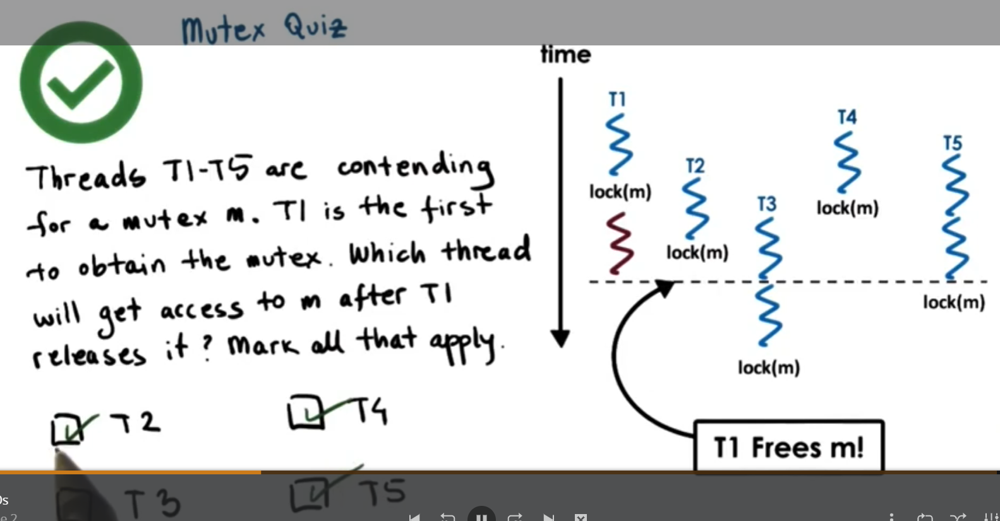

#### Producer/Consumer

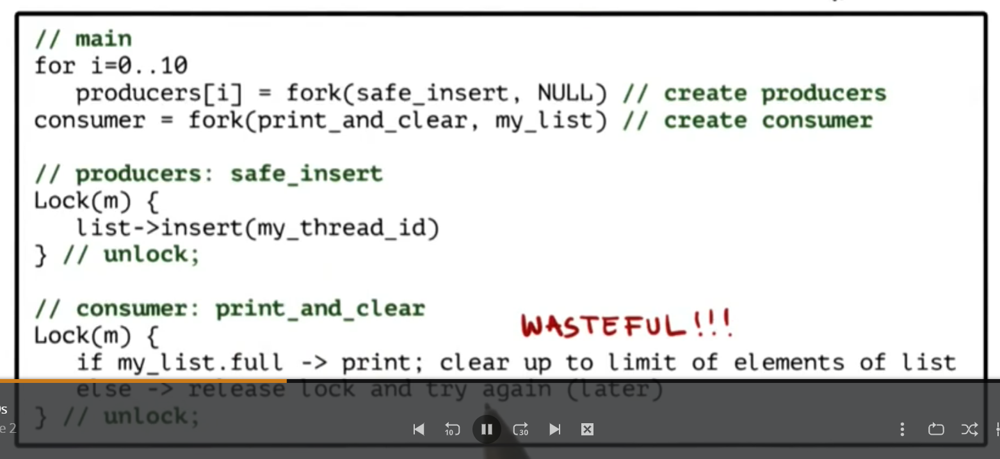


Condition variable

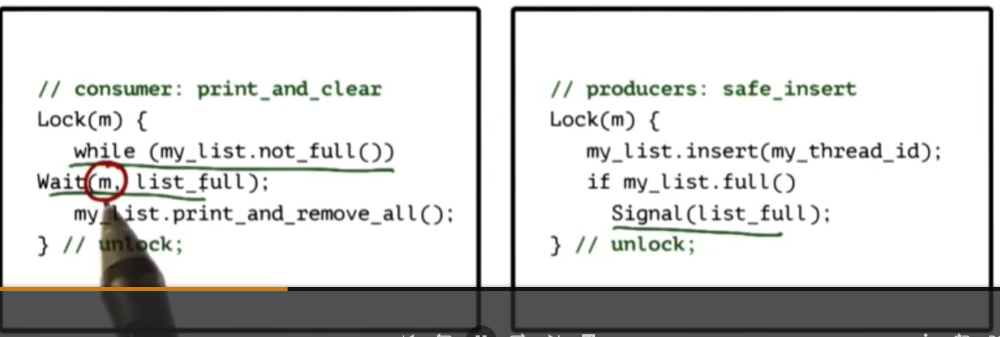

#### Condition Variable API

1. Condition: type
1. Wait(mutex, condition): mutex is automatically released & reaquired on wait.
1. Signal(condition): notify only on thread waiting on condition
1. Boardcast (condition): notify all waiting threads
1. Data structure: including mutex ref, list of waiting threads


Wait(mutex, condition){
    release mutex
    wait queue
    remove from queue
    reaquire mutex
    exit waiting operation
}


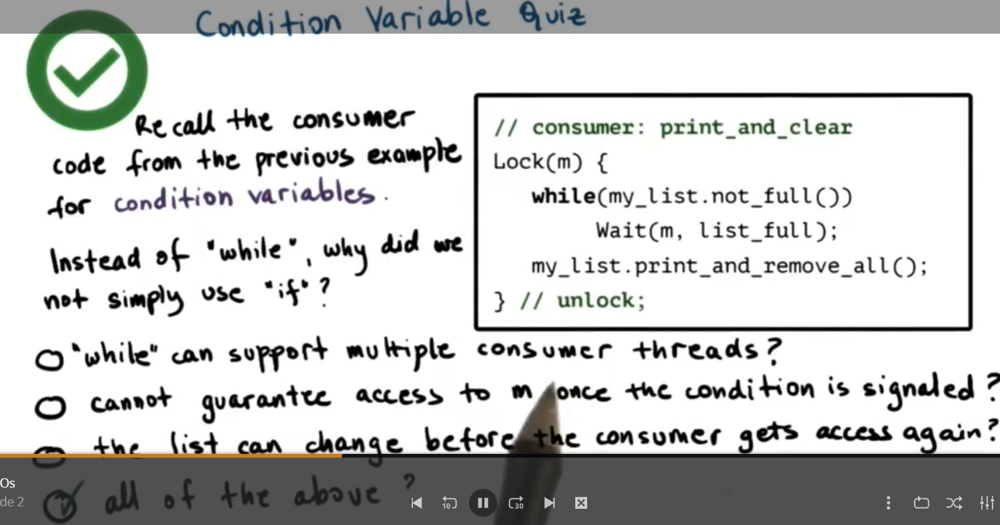

#### Reader/Writer problem

Multi readers/1 writer: 
1. if(read.count == 0) and (write.count == 0): read OK, write OK
1. if(read.count>0): read OK
1. if(write.count == 1): no read, no write


Resource counter:
1. Free: 0
2. Read: >0
3. Write: -1


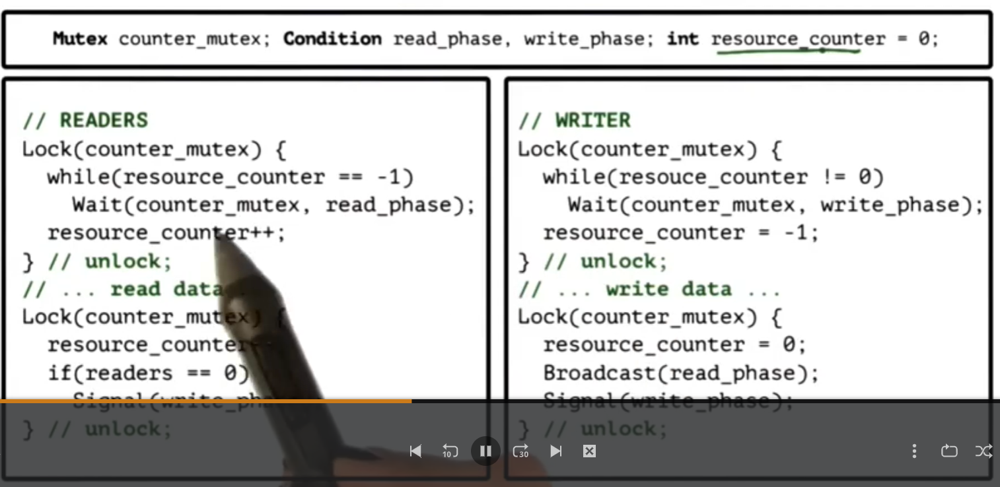

#### Typical critical section structure

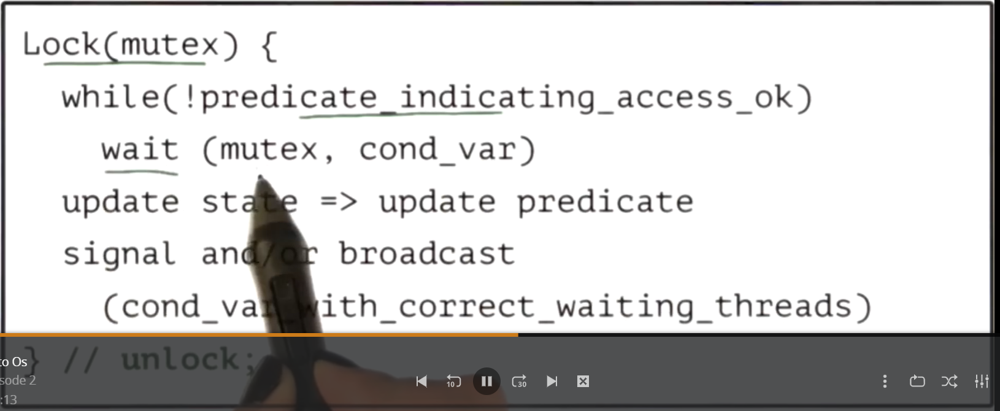

#### Critical Section Structure with Proxy Variable

Mutex offers access to only one thread. A more complicated sharing seniar can be implimented with Proxy variable

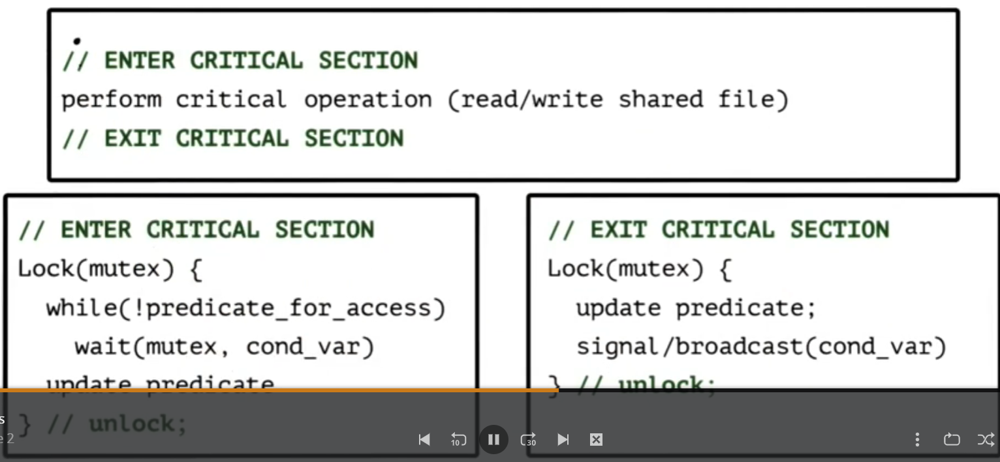

#### Avoiding Common Mistakes:


1. Keep track of mutex/condition variables used with a resource. When create a mutex, record the resources in the comment like "mutex for file1"
1. Check that you are always (and correctly) using lock & unlock: lock/unlock same resources everywhere in the program.
1. Use a single mutex to access a single resource. Don't use differnt mutex for a sigle resource.
1. Chekc that you are signaling correct condition
1. Check that you are not using signal when boardcast is needed. It can cause deadlock
1. Do you need priority guarantees? Thread execution order not controlled by signals to condition variables
1. Avoid spurious wake ups & dead locks

#### Spurious wake ups: unnessary wake up and has to wait again
When we wake threads up, knowing they may not be able to proceed.

When unlock after broadcast/signal, no other thread can get the lock.

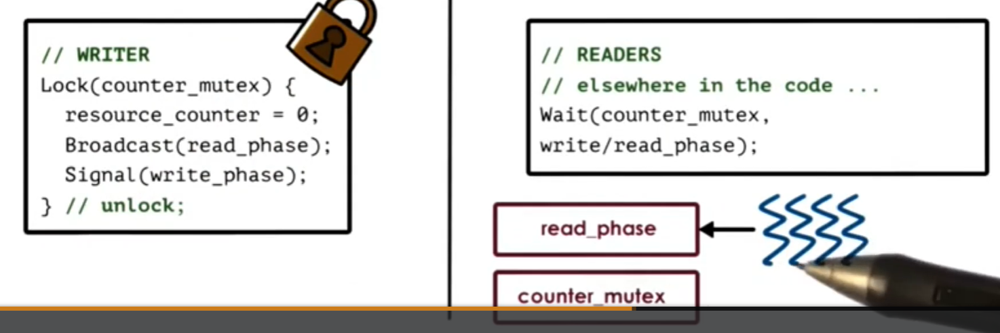





Can we always unlock mutex before boradcast/signal

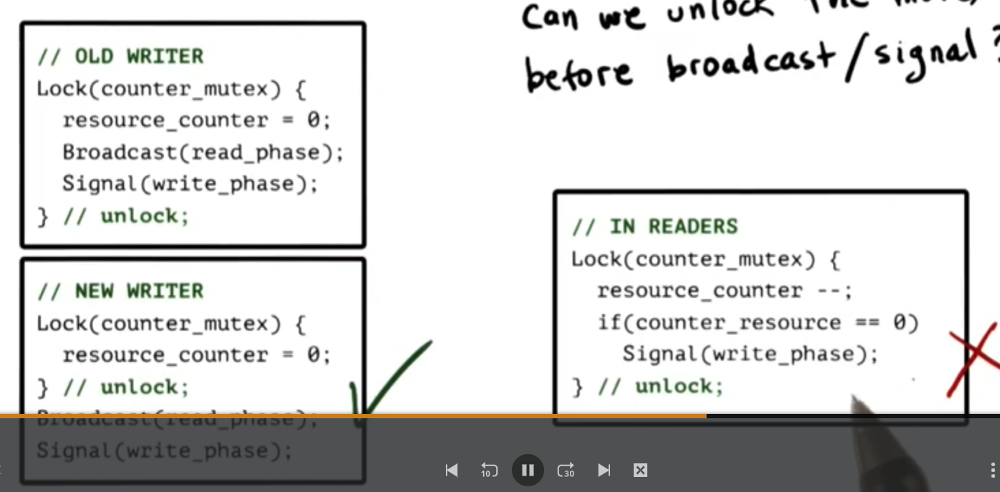

### Deadlocks
Two or more competing threads are waiting on each other to complete, but none of them ever do. Each waits on the other one.

A cycle in the wait graph is necessary and sufficient for a deadlock to occur (edges from thread waiting on a resource to thread owning the resource)
#### How to avoid:

1. fine-grained locking
1. Get all the locks upfornt and then release at the end
1. Use one mega lock
They are too restrictive: limits parallelism

#### Maintain a lock order: always first A then B. This will prevent cycles in wait graph.

1. Deadlock prevention: expensive
1. Deadlock detection & recovery: expensive to rollback
1. Apply the ostnch algorith: do nothing, if all else fails just reboot.


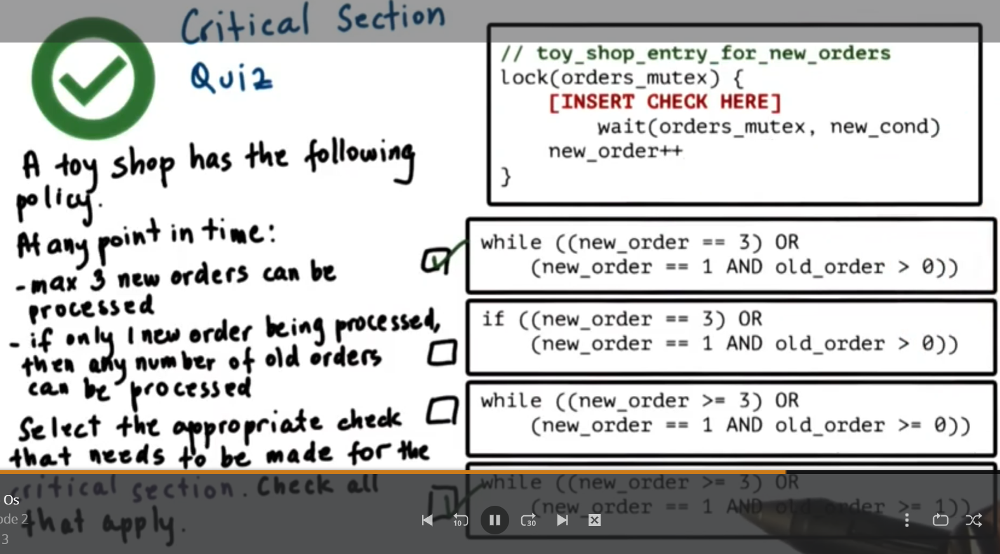

### Kernal vs User level Threads
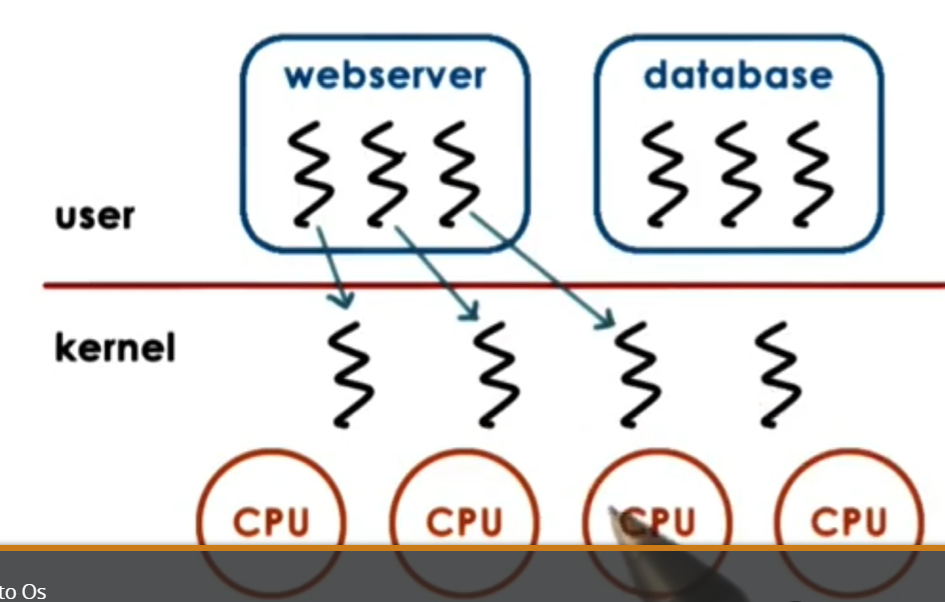

#### One-to-One (up to kernel level thread managers): 
Each user level thread has a kernel level thread associated. When a user level thread is created, either a kernel level thread is created or an existing kernel level thread is associated. 
Pros:
OS understand threads in terms of synchonization, blocking, scheduling. Application can benefit from the threading support from the OS

Cons:
1. has to go to the kernel for all operation (System calls may be expensive to cross the kernel/user boundary)
1. limited by the thread policies on the kernel. OS may have limits on policies or number of threads
1. limits portability.


#### Many-to-One (up to user level thread managers):
All user level threads are mapped to a single kernel level thread. Application decide which user level thread is mapped to the kernel level thread at any given point of time. User level threads will run only when the mapped kernel level thread run on the cpu

Pros: 

1. totally portable. 
1. Doesn't depend on OS limits and policies
1. Doesn't need system calls and don't rely on user/kernel transition in order to make decisions regarding scheduling, synchronization, blocking

Cons:
1. OS has no insights into applicaiton needs
1. OS may block entire process is one user level thread blocks on I/O



#### Many-to-many

Some user level threads can be associated with one kernel level th
read, and others may be associated with other kernel level threads.

Pros: 
1. can be the best of both worlds.
1. can have bound(one-to-one map permanently)/unbound(user level threads can be scheduled on any kernal level threadS) threads

Cons:
1. require coordination between user and kernel level thread managers.

At the kernel level(System scope）system wide thread management by OS-level thread managers (e.g. CPU scheduler)
At user level (process scope), user level library manages threads within a single process only.

Multi thread patterns:
1. #### boss-workers
    1. boss thread: assigns work to workers
    1. worker thread: performs entire task
    1. throughput of the system limited by boss thread: must keep boss thread efficient
    1. $throughput = \frac{1}{boss\_time\_per\_order}$
    1. boss assigns work by:
        1. directly signally specific worker: workers don't need to synchronize, but boss needs to track what each worker is doing, and throughput will go down
        1. placing work in producer/consumer queue: boss doens't need to know details about workers, higher throughput. Workers and boss need to synchonize their access to the queue.
    1. how many workers?
        1. On demand
        1. pool of workers/threads: static vs dynamic (create several threads when the pool needs to be adjusted)
    1. best:
        1. boss-work communicate through producer/consumer queue
        1. worker pool: static or dynamic
        1. pros: simplicity
        1. cons: thead pool management, ignore locality (if a thread just finish a task, it can be more efficiently to finish similar tasks)
    1. different works for different tasks
        1. pros: better locality, better Quality of Service (QoS) managment
        1. cons: load balancing
    
1. #### pipeline: 
     1. threads assigned are subtask in the system
     1. entire tasks = pipeline of threads
     1. multiple tasks concurrently in the system, in different pipeline stages
     1. throughput == weakest link: pipeline stage == thread pool
     1. shared buffer based communication between stage, similar to producer/consumer 
     
     1. sequence of stages
     1. stage = subtask
     1. each stage == thread pool
     1. buffer-based communication 
     1. Pros: specialization and locality (highly specialized thread)
     1. Cons: balancing and synchronization overhead
     
1. #### layered
     1. each layer group of related subtasks
     1. end-to-end task must pass up and down through all layers
     1. Pros: speicalization, less fine-grained than pipeline
     1. Cons: not suitable for all applications, synchronization overhead

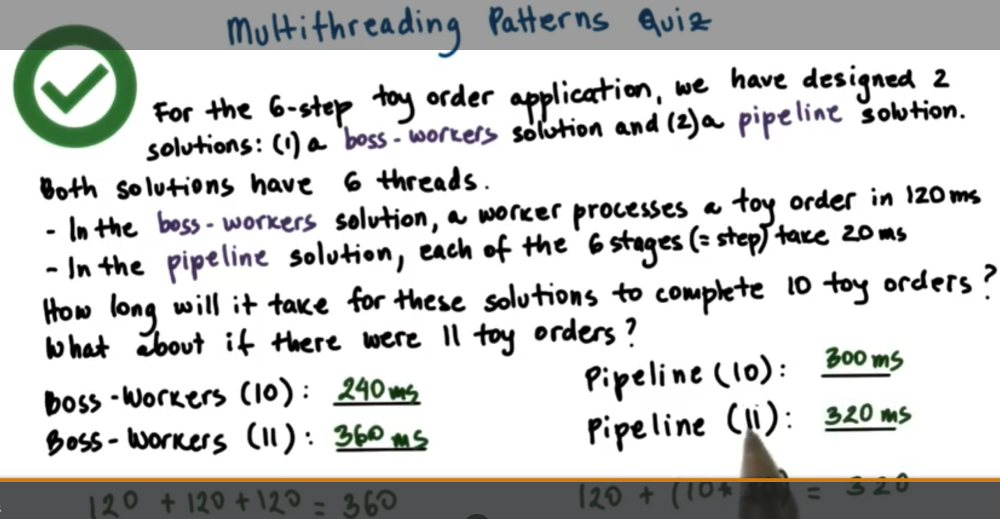